In [1]:
# Origin
origin = vector((0,0,0))
# Canonical axes
axis1=vector((1,0,0))
axis2=vector((0,1,0))
axis3=vector((0,0,1))

The old home telephone cables look like a circular helix:

In [2]:
#    x(t) = a*cos(t)
#    y(t) = a*cos(t)
#    z(t) = b*t
# Define parameters
a = 1  # radius of the helix
b = 1  # vertical stretch of the helix
t = var('t')  # parameter

# Define parametric equations for the helix
x = a * cos(t)
y = a * sin(t)
z = b * t

# Plot the helix
helix_plot = parametric_plot3d((x, y, z), (t, 0, 10 * pi), color='blue', thickness=2)
helix_plot.show()

Graphics3d Object

But we want to give it volume so in order to do so we will draw circles following the circular helix. To do so we need some information first:

In [3]:
# Define the curve as a symbolic vector
circular_helix = vector([x, y, z])

# Define the range for t, for example, from 0 to 2*pi
t_range = (0, 10*2 * pi)  # Start and end values for t
step_size = pi / 10 
t_values = srange(t_range[0], t_range[1] + step_size, step_size)

# And lets get the points where we will draw the circles
points = [circular_helix.substitute(t=t_val) for t_val in t_values]

# And their tangent directionto know how the circles have to face
tangent_vector = circular_helix.diff(t)
tangent_dir = [tangent_vector.substitute(t=t_val) for t_val in t_values]

Lets define now the circles that we will draw in the points following the circular helix:

In [4]:
r = 0.25  # radius of the circle (if we look at the image we do pi in 5 turns)
t2 = var('t2')  # parameter
# Parametrization of the circle in the xy-plane
x_t = r * cos(t2)
y_t = r * sin(t2)
z_t = 0  # z = 0 to stay in the xy-plane

circle_parametrization = vector([x_t, y_t, z_t])
circle_parametrization

# Define the range for t, for example, from 0 to 2*pi
t2_range = (0, 2 * pi)  # Start and end values for t
step_size = pi / 10
t2_values = srange(t2_range[0], t2_range[1] + step_size, step_size)
circle_points = [circle_parametrization.substitute(t2=t_val) for t_val in t2_values]
# Display results
line3d([circle_parametrization.substitute(t2=t_val) for t_val in t2_values], color='blue', thickness=2)

Graphics3d Object

Now that we have the points in the helix of where the circles have to go and what circle do we want to draw, we need to know the direction which the circle has to be facing. In order to do so, as we have said before, we have calculated the tangent direction of that point and from that one we can get a perpendicular direction of it and finally the last axis can just be the cross product of the two. Lets visualize how the circles should be facing in each of the points:

In [5]:
p = Graphics()
p += line3d(points, color='blue', thickness=2)

for i in range(len(t_values)):
    e3 = tangent_dir[i] # Tangent is the green one that is tangent to the point of the helix (can see in image)
    e1 = vector((-e3[1], e3[0], e3[2])).normalized() # Perpendicular to the tangent point
    e2 = e1.cross_product(e3).normalized() # Cross product
    
    p += arrow(points[i], points[i] + e3, color='green')
    p += arrow(points[i], points[i] + e1, color='red')
    p += arrow(points[i], points[i] + e2, color='blue')

p.show()

Graphics3d Object

Lets place the circles with change of reference system and see how they look:

In [19]:
p = Graphics()
p += line3d(points, color='blue', thickness=2)
circles_list = []
# For each point in the circular helix
for i in range(len(t_values)):
    e3p = tangent_dir[i]
    e1p = vector((-e3p[1], e3p[0], e3p[2])).normalized()
    e2p = e1p.cross_product(e3p).normalized()

    A = Matrix([[axis1.dot_product(e1p), axis1.dot_product(e2p), axis1.dot_product(e3p)],
                [axis2.dot_product(e1p), axis2.dot_product(e2p), axis2.dot_product(e3p)],
                [axis3.dot_product(e1p), axis3.dot_product(e2p), axis3.dot_product(e3p)]])

    T = Matrix([
        [A[0][0], A[0][1], A[0][2], points[i][0]],
        [A[1][0], A[1][1], A[1][2], points[i][1]],
        [A[2][0], A[2][1], A[2][2], points[i][2]],
        [0, 0, 0, 1]
    ])

    auxiliar_points = []
    # for each point in the circle we want to change its position
    for v in circle_points:
        oldP = vector((v[0], v[1], v[2], 1))
        newP = T * oldP
        auxiliar_points.append(vector((newP[0],newP[1],newP[2])))

    p += line3d(auxiliar_points, color='blue', thickness=2)
    circles_list.append(auxiliar_points)

faces = []

# This is to draw the faces from circle to circle (testing from the first to the second)
#for i in range(len(circle_list)):
for i in range(len(t2_values) - 1):
    # Create the face as a quadrilateral between the two circles
    p1 = circles_list[0][i]
    p2 = circles_list[0][i+1]
    p3 = circles_list[1][i]
    p4 = circles_list[1][i+1]
    p += polygon3d([p1, p2, p4, p3], color=(0.5, 0.5, 1))
p.show()

Graphics3d Object

Draw all faces from circle to circle and show the cable:

In [20]:
p = Graphics()
faces = []

for j in range(len(circles_list) - 1):
    for i in range(len(t2_values) - 1):
        # Create the face as a quadrilateral between the two circles
        p1 = circles_list[j][i]
        p2 = circles_list[j][i+1]
        p3 = circles_list[j+1][i]
        p4 = circles_list[j+1][i+1]
        p += polygon3d([p1, p2, p4, p3], color=(0.5, 0.5, 1))
p.show()

Graphics3d Object

In order to draw the toothpaste we have devided the drawing in 3 sections. First we will draw the cap, second the cap holder and finally the body of the toothpaste. At the end we will combine them all and change the reference system as asked in order to be laying at z = 0

To draw the cap we have been inspired by the Epicicolide curve:

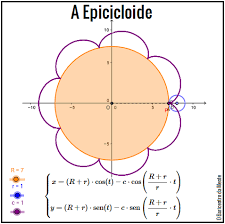

In [21]:
from IPython.display import Image
Image(filename="images.png")

Here I tried following the same technique (drawing faces) but at the time to connect points from the epicicloide to the a sphere to create more complex objects I was having trouble lining the points and even though it seems I manage to do so I had to spend too much time due to offsets and so on so I decided to use the proper way to draw in sagemath (which initially I was not aware of).

In [22]:
#Epicicolode 1
r0 = 1  # radius of the circle
r1 = 0.02
t3 = var('t3')  # parameter
# Epiciclode 2
r2 = 1*0.8
r3 = 0.02*0.8
t4 = var('t4')  # parameter

x_t3 = (r0 + r1) * sin(t3) - r1 * sin(t3*(1+(r0/r1)))
y_t3 = (r0 + r1) * cos(t3) - r1 * cos(t3*(1+(r0/r1)))
z_t3 = 0

x_t4 = (r2 + r3) * sin(t4) - r3 * sin(t4*(1+(r2/r3)))
y_t4 = (r2 + r3) * cos(t4) - r3 * cos(t4*(1+(r2/r3)))
z_t4 = 2

tap_param1 = vector([x_t3, y_t3, z_t3])

tap_param2 = vector([x_t4, y_t4, z_t4])

# Define the range for t, for example, from 0 to 2*pi
t2_range = (0, 2 * pi)  # Start and end values for t
step_size = pi / 200
t2_values = srange(t2_range[0], t2_range[1] + step_size, step_size)

tap_points1 = [tap_param1.substitute(t3=t_val) for t_val in t2_values]

tap_points2 = [tap_param2.substitute(t4=t_val) for t_val in t2_values]

r = 0.7  # radius of the circle
t2 = var('t2')  # parameter
# Parametrization of the circle in the xy-plane
x_t = r * cos(t2)
y_t = r * sin(t2)
z_t = 2  # z = 0 to stay in the xy-plane

circle_param = vector([x_t, y_t, z_t])

t2_values = srange(t2_range[0], t2_range[1] + step_size, step_size)

# Display results
circle_p = [circle_param.substitute(t2=t_val) for t_val in t2_values]

p = Graphics()
p += line3d(tap_points1, color='blue', thickness=2)
p += line3d(tap_points2, color='green', thickness=2)

for i in range(len(t2_values) - 1):
        # Create the faces between the two epiciclodes
        p1 = tap_points1[i]
        p2 = tap_points1[i+1]
        p3 = tap_points2[i]
        p4 = tap_points2[i+1]
        p += polygon3d([p1, p2, p4, p3], color=(0.5, 0.5, 1))
        p += line3d(circle_p, color='yellow', thickness=2)
        if i < 40:
            #print(i%round(len(t2_values)/8))
            c1 = circle_p[len(t2_values)-1-(i+(len(t2_values)-100))]
            p += point3d(c1, color='black', size=1)
            p += point3d(p3, color='red', size=1)
            c2 = circle_p[len(t2_values)-1-(i+(len(t2_values)-101))]
            p += point3d(c2, color='green', size=1)
            p += polygon3d([c2,c1, p4, p3], color=(0.5, 0.5, 1))
        
p.show()


Graphics3d Object

Here I learned that the parametric_plot3d existed and decided to do the same but now it was much easier:

In [23]:
#Epicicolode 1
r0 = 0.8  # radius of the circle
r1 = 0.02
t = var('t')  # parameter
# Epiciclode 2 (I have done it 80% smaller and like this top is smaller than bottom but same shape)
r2 = 0.8*0.8
r3 = 0.02*0.8

x1 = (r0 + r1) * sin(t) - r1 * sin(t*(1+(r0/r1)))
y1 = (r0 + r1) * cos(t) - r1 * cos(t*(1+(r0/r1)))
z1 = 0

x2 = (r2 + r3) * sin(t) - r3 * sin(t*(1+(r2/r3)))
y2 = (r2 + r3) * cos(t) - r3 * cos(t*(1+(r2/r3)))
z2 = 2 # assign it a little bit higher


# And we can do the interpolation between the two shapes and like this we get all the points in between which
# creates the faces by themselves
t2 = var('t2')  # parameter
x_interp = (1 - t2) * x1 + t2 * x2
y_interp = (1 - t2) * y1 + t2 * y2 + 1 #(+1) remove from center position
z_interp = (1 - t2) * z1 + t2 * z2

# Substitute the specific value of t into the interpolation

p = Graphics()
p += parametric_plot3d(
    (x_interp, y_interp, z_interp),
    (t, 0, 2*pi),  # Range for u (adjust as needed)
    (t2, 0 , 1),
    plot_points=(300, 20),
    color="white",
    opacity=1
)
p.show()

Graphics3d Object

In [24]:
# Close bottom and top cap
x2b = 0
y2b = 0
z2b = 0 # assign it a little bit higher

x2t = 0
y2t = 0
z2t = 2 # assign it a little bit higher

x_interpt = (1 - t2) * x2 + t2 * x2t
y_interpt = (1 - t2) * y2 + t2 * y2t + 1 #(+1) remove from center position
z_interpt = (1 - t2) * z2 + t2 * z2t

x_interpb = (1 - t2) * x1 + t2 * x2b
y_interpb = (1 - t2) * y1 + t2 * y2b + 1 #(+1) remove from center position
z_interpb = (1 - t2) * z1 + t2 * z2b

# Substitute the specific value of t into the interpolation
p = Graphics()
p += parametric_plot3d(
    (x_interpb, y_interpb, z_interpb),
    (t, 0, 2*pi),  # Range for u (adjust as needed)
    (t2, 0 , 1),
    plot_points=(300, 20),
    color="white",
    opacity=1
)
p += parametric_plot3d(
    (x_interpt, y_interpt, z_interpt),
    (t, 0, 2*pi),  # Range for u (adjust as needed)
    (t2, 0 , 1),
    plot_points=(300, 20),
    color="white",
    opacity=1
)
p.show()

Graphics3d Object

No that the cap is done lets do the neck of the body or the cap holder which we will also use a parametric equation. The values of this one will be inspired by the hyperbolic cosine:

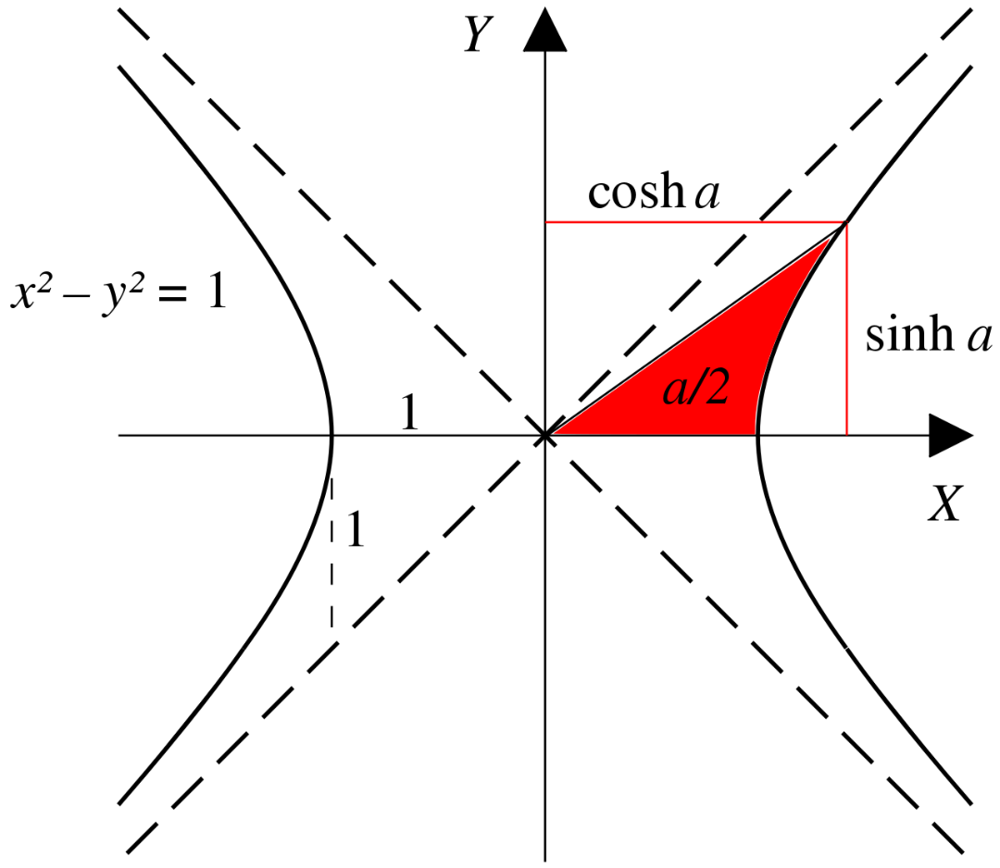

In [25]:
from IPython.display import Image
Image(filename="hyperbolic-functions.png")

In [26]:
t = var('t')
t2 = var('t2')
a = 0.65  # Control x-axis scaling
b = 0.5  # Control y-axis scaling
r = 0.5  # Control z-axis "roundness" amplitude

# Define parametric equations
x_t = a * cosh(t) * cos(t2)
y_t = a * cosh(t) * sin(t2) + 1 #(+1) remove from center position
z_t = b * sinh(t)

# Plot the parametric curve
p = Graphics()
p += parametric_plot3d((x_t, y_t, z_t), (t, -1, 0),(t2, 0, 2*pi), color='blue', thickness=2)
p.show()

Graphics3d Object

And finally lets draw the conoid shape for the body of the toothpaste. We will also change of reference system of the conoid in order to place it under the cap holder and like this they will both align:

In [27]:
# Define the parameters and scaling factor
u, v = var('u v')
a = 7  # Controls the spread of the conoid
b = 1
# Define parametric equations for the conoid
x_uv = u
y_uv = (b/a)*u*cos(v)
z_uv = (b/a)*a*sin(v)

# Here we match the direction of the conoid that we would want to have as right now the parametric
# equation would be placed horizontaly
e1=vector((0,0,1))
e2=vector((0,1,0))
e3=vector((1,0,0))

A = Matrix([[e1.dot_product(axis1), e1.dot_product(axis2), e1.dot_product(axis3)],
            [e2.dot_product(axis1), e2.dot_product(axis2), e2.dot_product(axis3)],
            [e3.dot_product(axis1), e3.dot_product(axis2), e3.dot_product(axis3)]])

T1 = Matrix([
    [A[0][0], A[0][1], A[0][2], origin[0]],
    [A[1][0], A[1][1], A[1][2], origin[1]],
    [A[2][0], A[2][1], A[2][2], origin[2]],
    [0, 0, 0, 1]
])

newCordSys_x_t = T1[0, 0]*x_uv + T1[0, 1]*y_uv + T1[0, 2]*z_uv
newCordSys_y_t = T1[1, 0]*x_uv + T1[1, 1]*y_uv + T1[1, 2]*z_uv + 1 #(+1) remove from center position
newCordSys_z_t = T1[2, 0]*x_uv + T1[2, 1]*y_uv + T1[2, 2]*z_uv - 7.6 # I could do the change of reference system here but I can just reduce its height (7) and the one from the neck (0.6) and like this I don't have to do another change of reference system

p = Graphics()
p += parametric_plot3d((x_t, y_t, z_t), (t, -1, 0),(t2, 0, 2*pi), color='blue', thickness=2)
p += parametric_plot3d((x_interpb, y_interpb, z_interpb),(t, 0, 2*pi),(t2, 0 , 1),plot_points=(300, 20),color="white",opacity=1)
p += parametric_plot3d((x_interpt, y_interpt, z_interpt),(t, 0, 2*pi),(t2, 0 , 1),plot_points=(300, 20),color="white",opacity=1)
p += parametric_plot3d((x_interp, y_interp, z_interp),(t, 0, 2*pi), (t2, 0 , 1),plot_points=(300, 20),color="white",opacity=1)
p += parametric_plot3d((newCordSys_x_t, newCordSys_y_t, newCordSys_z_t), (u, 0, 7), (v, 0, 2*pi),  color='white', opacity=1)
p.show()
# Plot the parametric surface

Graphics3d Object

But we are not finished yet, we want the next shape to be alignes as it if was touching a table meaning that the flat part of the body would be facing z = 0. In order to do that we need to do a change of reference system. In this case the way we decided to get the new axis is getting in the middle of the flat face and then create a new coordinate system following the normal of the shape shown here:

In [28]:

# Specify values for u and v to find the new plane direction (we need at least two points)
u1_val, v1_val = 0, 0  # Frist point (at distance 0)
u2_val, v2_val = 7/2, pi  # Second point (at the middle of the the conoid and at the flat side that would be 0,pi or 2pi)


# Evaluate the coordinates at the first point (u1, v1) and compute its values
xpoint1 = newCordSys_x_t.substitute(u=u1_val, v=v1_val)
ypoint1 = newCordSys_y_t.substitute(u=u1_val, v=v1_val)
zpoint1 = newCordSys_z_t.substitute(u=u1_val, v=v1_val)

# Evaluate the coordinates at the second point (u2, v2) and compute its values
xpoint2 = newCordSys_x_t.substitute(u=u2_val, v=v2_val)
ypoint2 = newCordSys_y_t.substitute(u=u2_val, v=v2_val)
zpoint2 = newCordSys_z_t.substitute(u=u2_val, v=v2_val)

# Calculate the direction vector from the one at the edge to the one at the center
direction_vector = vector((xpoint2 - xpoint1, ypoint2 - ypoint1, zpoint2 - zpoint1))

# New reference system we want to translate to origin
e1 = direction_vector/direction_vector.norm()
e2 = vector((-1,0,0))
e3 = -e1.cross_product(e2)

# Visualize the points chosen
p = Graphics()
p += point3d((xpoint1, ypoint1, zpoint1), size=30, color='yellow')
p += point3d((xpoint2, ypoint2, zpoint2), size=30, color='yellow')
# visualize conoid
p += parametric_plot3d((newCordSys_x_t, newCordSys_y_t, newCordSys_z_t), (u, 0, 7), (v, 0, 2*pi),  color='white', opacity=0.7)

NewOrigin = vector((xpoint2,ypoint2,zpoint2))

new_axes = arrow(NewOrigin, NewOrigin + e1, color='green') + \
    arrow(NewOrigin, NewOrigin + e2, color='red') + \
    arrow(NewOrigin, NewOrigin + e3, color='blue')
p += new_axes
p.show()


Graphics3d Object

And then if we apply the change of reference system to all our parametrization (objects) we end up with the toothpaste aligned at z = 0:

In [29]:
# Origin
origin = vector((0,0,0))
# Canonical axes
axis1=vector((1,0,0))
axis2=vector((0,1,0))
axis3=vector((0,0,1))

A = Matrix([[e1.dot_product(axis1), e1.dot_product(axis2), e1.dot_product(axis3)],
            [e2.dot_product(axis1), e2.dot_product(axis2), e2.dot_product(axis3)],
            [e3.dot_product(axis1), e3.dot_product(axis2), e3.dot_product(axis3)]])

T2 = Matrix([
    [A[0][0], A[0][1], A[0][2], origin[0]],
    [A[1][0], A[1][1], A[1][2], origin[1]],
    [A[2][0], A[2][1], A[2][2], origin[2]],
    [0, 0, 0, 1]
])

newCordSys2_x_t = T2[0, 0]*newCordSys_x_t + T2[0, 1]*newCordSys_y_t + T2[0, 2]*newCordSys_z_t
newCordSys2_y_t = T2[1, 0]*newCordSys_x_t + T2[1, 1]*newCordSys_y_t + T2[1, 2]*newCordSys_z_t
newCordSys2_z_t = T2[2, 0]*newCordSys_x_t + T2[2, 1]*newCordSys_y_t + T2[2, 2]*newCordSys_z_t


newCordSys_neck_x_t = T2[0, 0]*x_t + T2[0, 1]*y_t + T2[0, 2]*z_t
newCordSys_neck_y_t = T2[1, 0]*x_t + T2[1, 1]*y_t + T2[1, 2]*z_t
newCordSys_neck_z_t = T2[2, 0]*x_t + T2[2, 1]*y_t + T2[2, 2]*z_t

newCordSys_cap_x_interp0 = T2[0, 0]*x_interp + T2[0, 1]*y_interp + T2[0, 2]*z_interp
newCordSys_cap_y_interp0 = T2[1, 0]*x_interp + T2[1, 1]*y_interp + T2[1, 2]*z_interp
newCordSys_cap_z_interp0 = T2[2, 0]*x_interp + T2[2, 1]*y_interp + T2[2, 2]*z_interp

newCordSys_cap_x_interp1 = T2[0, 0]*x_interpb + T2[0, 1]*y_interpb + T2[0, 2]*z_interpb
newCordSys_cap_y_interp1 = T2[1, 0]*x_interpb + T2[1, 1]*y_interpb + T2[1, 2]*z_interpb
newCordSys_cap_z_interp1 = T2[2, 0]*x_interpb + T2[2, 1]*y_interpb + T2[2, 2]*z_interpb

newCordSys_cap_x_interp2 = T2[0, 0]*x_interpt + T2[0, 1]*y_interpt + T2[0, 2]*z_interpt
newCordSys_cap_y_interp2 = T2[1, 0]*x_interpt + T2[1, 1]*y_interpt + T2[1, 2]*z_interpt
newCordSys_cap_z_interp2 = T2[2, 0]*x_interpt + T2[2, 1]*y_interpt + T2[2, 2]*z_interpt


p = Graphics()
p += parametric_plot3d((newCordSys_neck_x_t, newCordSys_neck_y_t, newCordSys_neck_z_t), (t, -1, 0),(t2, 0, 2*pi), color='blue', thickness=2)
p += parametric_plot3d((newCordSys_cap_x_interp1, newCordSys_cap_y_interp1, newCordSys_cap_z_interp1),(t, 0, 2*pi),(t2, 0 , 1),plot_points=(300, 20),color="white",opacity=1)
p += parametric_plot3d((newCordSys_cap_x_interp2, newCordSys_cap_y_interp2, newCordSys_cap_z_interp2),(t, 0, 2*pi),(t2, 0 , 1),plot_points=(300, 20),color="white",opacity=1)
p += parametric_plot3d((newCordSys_cap_x_interp0, newCordSys_cap_y_interp0, newCordSys_cap_z_interp0),(t, 0, 2*pi), (t2, 0 , 1),plot_points=(300, 20),color="white",opacity=1)
p += parametric_plot3d((newCordSys2_x_t, newCordSys2_y_t, newCordSys2_z_t), (u, 0, 7), (v, 0, 2*pi),  color='white', opacity=1)
p.show()

Graphics3d Object